In [1]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'real-and-fake-face-detection:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F105271%2F250645%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240524%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240524T072709Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D5052c1006211a331d5160a7f1321d8629a8785d9dd6e7767817087ef93579d3b40a7110e0f0a8647b26a60bb335fb453fb207a3d62bd50690eb48676b7192651f6dee1619e79a2f2bd3bda6276c51bcfde183baa37b4714274f51790264fc7ae644d34c4e6904751c347eab9c96f877fedb8690bd7297a11ffbd08edb1595658e0599fd303b9f6e67d53b78aa4cb9e1ad0970ae18e85e3a97cdd2c6b6e95d9d029741c25d04bd2b590cb08f7d7c917b80b90099f7d2403f38553f75952b0b3e00885f6bb4367ecba0a0ac11b021914e52580d74f9f1f336cce256fd4c68b81ff2bb159be6f97d6acb2437185a183a380b77d7cbdc2306d5164da127107fd5fda'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 452107760 bytes downloaded
Downloaded and uncompressed: real-and-fake-face-detection
Data source import complete.


## Comparison of the ability of various neural networks to distinguish real faces from fake ones with visualization

In this notebook I will compare some CNNs - little CNN of my architecture, not pretrained ResNet-50 and pretrained one - to find out if the architecture and pre-training of networks affects the solution of a problem where there is very little data. Let's do it!

In [2]:
import os
import sys

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import cv2

import albumentations as A
from albumentations.pytorch import ToTensorV2

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor
from torchvision import models

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

Some actions for loading images:

In [3]:
real_dir = '../input/real-and-fake-face-detection/real_and_fake_face/training_real/'
real_path = os.listdir(real_dir)

fake_dir = '../input/real-and-fake-face-detection/real_and_fake_face/training_fake/'
fake_path = os.listdir(fake_dir)

In [4]:
def load_img(path):
    '''Loading images from directory
    and changing color space from cv2 standard BGR to RGB
    for better visualization'''
    image = cv2.imread(path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image_rgb

Now let's see the pictures, real faces first, and then fake ones:

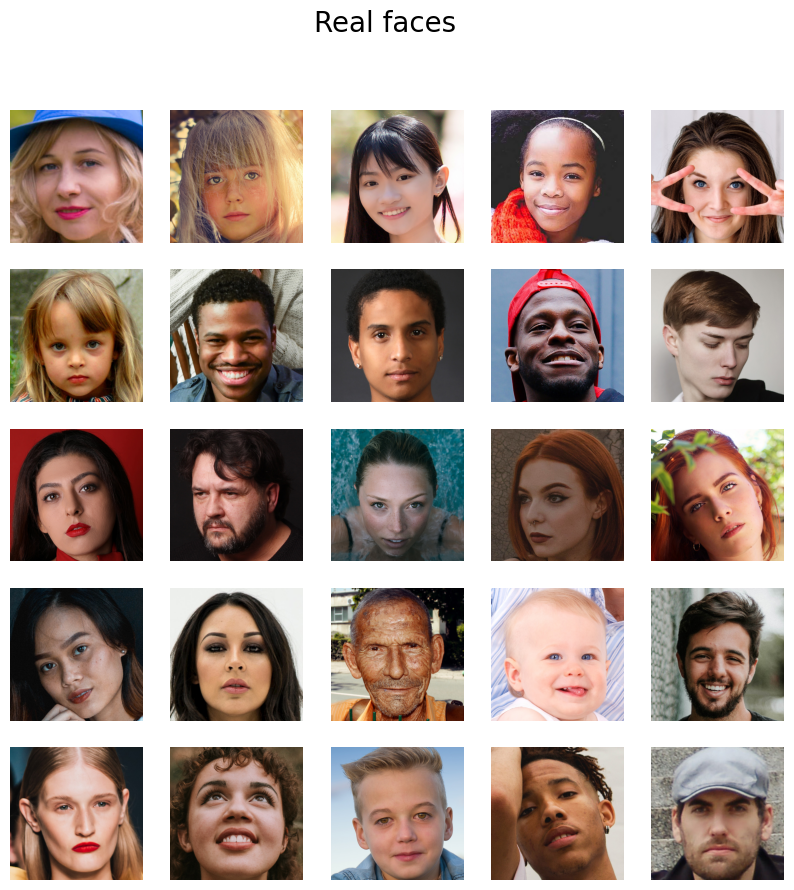

In [5]:
fig = plt.figure(figsize=(10, 10))

for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(load_img(real_dir + real_path[i]))
    plt.suptitle("Real faces", fontsize=20)
    plt.axis('off')

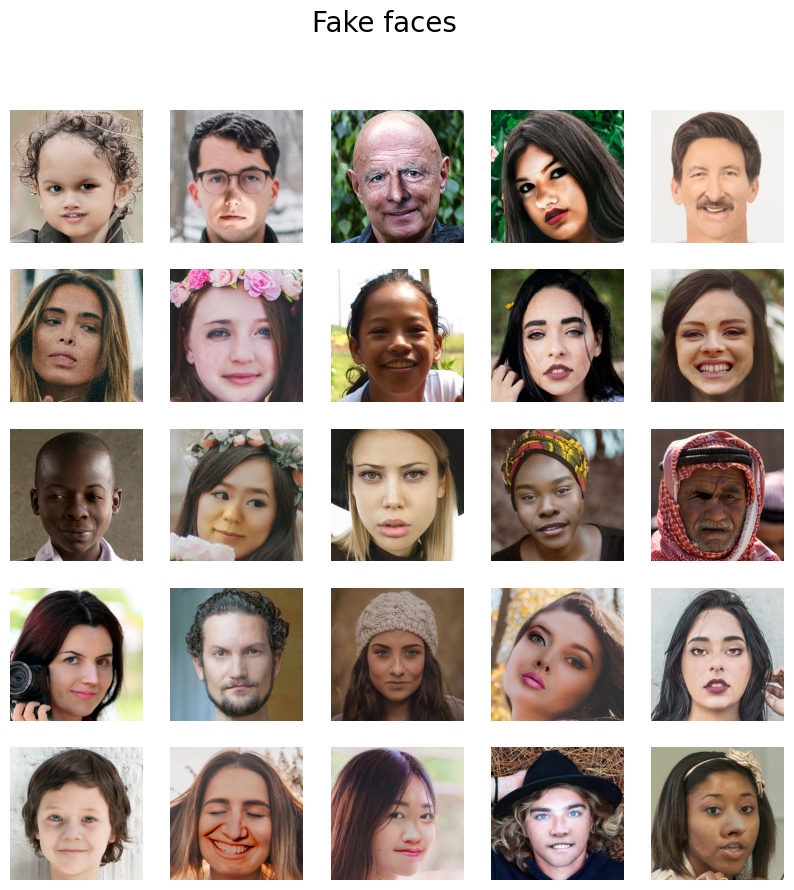

In [6]:
fig = plt.figure(figsize=(10, 10))

for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(load_img(fake_dir + fake_path[i]))
    plt.suptitle("Fake faces", fontsize=20)
    plt.axis('off')

As you can see, fake faces have some weird elements on them, like inaccurately inserted fragments, spots, illiminated areas. The main task for CNNs is to find this weird features.



Now I collect all images to DataFrame for ease dataset formation:

In [7]:
real_df = pd.DataFrame({'image_path': real_dir + real_path[i], 'label': 1} for i in range(0, 1081))
fake_df = pd.DataFrame({'image_path': fake_dir + fake_path[i], 'label': 0} for i in range(0, 960))

In [8]:
df = pd.concat([real_df, fake_df], ignore_index=True)
df.tail(10)

,image_path,label
2031,../input/real-and-fake-face-detection/real_and...,0
2032,../input/real-and-fake-face-detection/real_and...,0
2033,../input/real-and-fake-face-detection/real_and...,0
2034,../input/real-and-fake-face-detection/real_and...,0
2035,../input/real-and-fake-face-detection/real_and...,0
2036,../input/real-and-fake-face-detection/real_and...,0
2037,../input/real-and-fake-face-detection/real_and...,0
2038,../input/real-and-fake-face-detection/real_and...,0
2039,../input/real-and-fake-face-detection/real_and...,0
2040,../input/real-and-fake-face-detection/real_and...,0


In [9]:
df = shuffle(df)
df = df.reset_index(drop=True)
df.head(10)

,image_path,label
0,../input/real-and-fake-face-detection/real_and...,1
1,../input/real-and-fake-face-detection/real_and...,0
2,../input/real-and-fake-face-detection/real_and...,0
3,../input/real-and-fake-face-detection/real_and...,1
4,../input/real-and-fake-face-detection/real_and...,0
5,../input/real-and-fake-face-detection/real_and...,1
6,../input/real-and-fake-face-detection/real_and...,1
7,../input/real-and-fake-face-detection/real_and...,1
8,../input/real-and-fake-face-detection/real_and...,0
9,../input/real-and-fake-face-detection/real_and...,0


In [10]:
train_df, val_df = train_test_split(df, test_size=0.2, random_state=42)

Adding some configuration here (don't ask me why there is no config class here, let this time be just a config cell :)

In [11]:
image_size = 224
batch_size = 64
num_epochs = 10
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

Defining transforms for train and validation images, visual transforms is for visualization function that shows one batch. All transforms, except of usual ones like ToTensor, have been chosen because they can help CNNs to find weird features well.

In [12]:
image_transforms = {'train_transform': A.Compose([A.Resize(image_size, image_size),
                                                  A.HorizontalFlip(p=0.5),
                                                  A.RandomBrightnessContrast(always_apply=False,
                                                                             p=0.4),
                                                  A.Solarize(always_apply=False,
                                                             p=0.4,
                                                             threshold=(42, 42)),
                                                  A.MultiplicativeNoise(always_apply=False,
                                                                        p=0.8,
                                                                        multiplier=(0.6800000071525574, 1.409999966621399),
                                                                        per_channel=True,
                                                                        elementwise=True),
                                                  A.Normalize(mean=(0.485, 0.456, 0.406),
                                                              std=(0.229, 0.224, 0.225),
                                                              max_pixel_value=255.0,
                                                              p=1.0),
                                                  ToTensorV2()]),

                   'validation_transform': A.Compose([A.Resize(image_size, image_size),
                                                      A.Normalize(mean=(0.485, 0.456, 0.406),
                                                                  std=(0.229, 0.224, 0.225),
                                                                  max_pixel_value=255.0,
                                                                  p=1.0),
                                                      ToTensorV2()]),
                   'visualization_transform': A.Compose([A.Resize(image_size, image_size),
                                                         A.HorizontalFlip(p=0.5),
                                                         A.RandomBrightnessContrast(always_apply=False,
                                                                                    p=0.4),
                                                  A.Solarize(always_apply=False,
                                                             p=0.4,
                                                             threshold=(42, 42)),
                                                  A.MultiplicativeNoise(always_apply=False,
                                                                        p=0.8,
                                                                        multiplier=(0.6800000071525574, 1.409999966621399),
                                                                        per_channel=True,
                                                                        elementwise=True)])}

Defining Dataset class, there is no magic here, just what PyTorch tutorial learn us:

In [13]:
class ImageDataset(Dataset):
    def __init__(self, image_labels, image_dir, transform=None, target_transform=None):
        self.image_labels = image_labels
        self.image_dir = image_dir
        self.transform = transform
        self.target_transform = target_transform


    def __len__(self):
        return len(self.image_labels)


    def __getitem__(self, index):
        image_path = self.image_dir.iloc[index]
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = self.image_labels.iloc[index]
        if self.transform:
            image = self.transform(image=image)['image']
        if self.target_transform:
            label = self.target_transform(label=label)
        return image, label

In [14]:
train_label = train_df['label']
train_features = train_df['image_path']

val_label = val_df['label']
val_features = val_df['image_path']

train_dataset = ImageDataset(train_label,
                             train_features,
                             transform=image_transforms['train_transform'])
val_dataset = ImageDataset(val_label,
                           val_features,
                           transform=image_transforms['validation_transform'])
visual_train_dataset =  ImageDataset(train_label,
                                     train_features,
                                     transform=image_transforms['visualization_transform'])

And of course DataLoaders:

In [15]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
visual_loader = DataLoader(visual_train_dataset, batch_size=batch_size, shuffle=True)

Checking if there is all OK in DataLoaders:

In [16]:
val_loader

In [17]:
visual_train_f, visual_train_t = next(iter(visual_loader))
print(f'Feature batch shape: {visual_train_f.size()}')
print(f'Target batch shape: {visual_train_t.size()}')

Feature batch shape: torch.Size([64, 224, 224, 3])
Target batch shape: torch.Size([64])


In [18]:
for item in visual_loader:
    img, label = item[0], item[1]
    print(img, label)

Streaming output truncated to the last 5000 lines.
          ...,
          [118, 117, 106],
          [144, 152, 168],
          [115,  92, 138]]],


        [[[112, 101, 226],
          [ 94, 124, 187],
          [ 96,  88, 238],
          ...,
          [119, 210,  26],
          [188, 153,  18],
          [147, 167,  40]],

         [[ 89, 161, 217],
          [125, 167, 148],
          [112, 138, 134],
          ...,
          [120, 144,  26],
          [152, 255,  14],
          [108, 170,  31]],

         [[ 87, 189, 195],
          [ 96, 157, 255],
          [ 83, 147, 180],
          ...,
          [130, 199,  20],
          [ 92, 147,  34],
          [154, 157,  39]],

         ...,

         [[  1,  87,   2],
          [  2,  52,   0],
          [  1,  73,   0],
          ...,
          [103, 137,   6],
          [ 99, 145,   5],
          [111, 237,   2]],

         [[  1,  81,   2],
          [  2,  79,   0],
          [  0,  49,   0],
          ...,
          [102, 139,  

Seems like everything is OK. Now let's see how one batch of augmented images looks:

In [19]:
def plot_batch(features, target, batch_size=batch_size):
    '''Shows one batch of augmented images'''
    plt.figure(figsize=(10, 40))
    for i in range(batch_size):
        img = features[i]
        label = target[i]

        plt.subplot(16, 4, i+1)
        plt.title(f'Class: {label}')
        plt.imshow(img)
    plt.show()

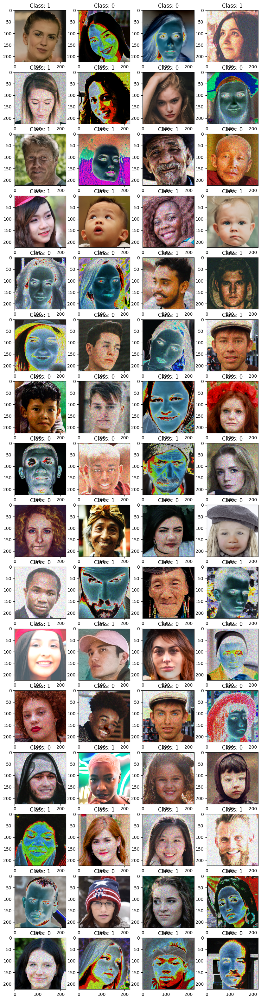

In [20]:
plot_batch(visual_train_f, visual_train_t)

It's time to define and train some CNNs.
First of them will be a little custom CNN FaceNet, I define it's architecture by myself and train it with a simple training loop:

In [21]:
class FaceNet(nn.Module):
    def __init__(self):
        super(FaceNet, self).__init__()
        self.conv_1 = nn.Conv2d(in_channels=3, out_channels=18, kernel_size=3)
        self.maxpool = nn.MaxPool2d(kernel_size=2)
        self.batchnorm_1 = nn.BatchNorm2d(18)
        self.conv_2 = nn.Conv2d(in_channels=18, out_channels=18, kernel_size=3)
        self.batchnorm_2 = nn.BatchNorm2d(18)
        self.conv_3 = nn.Conv2d(in_channels=18, out_channels=32, kernel_size=3)
        self.fc_1 = nn.Linear(21632, 128)
        self.fc_2 = nn.Linear(128, 64)
        self.classifier = nn.Linear(64, 1)

    def forward(self, x):
        x = self.maxpool(nn.functional.relu(self.conv_1(x)))
        x = self.maxpool(nn.functional.relu(self.conv_2(x)))
        x = self.maxpool(nn.functional.relu(self.conv_3(x)))
        x = torch.flatten(x, 1)
        x = nn.functional.relu(self.fc_1(x))
        x = nn.functional.relu(self.fc_2(x))
        x = torch.sigmoid(self.classifier(x))
        return x

In [22]:
model_custom = FaceNet()
model_custom.to(device)

FaceNet(
  (conv_1): Conv2d(3, 18, kernel_size=(3, 3), stride=(1, 1))
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (batchnorm_1): BatchNorm2d(18, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_2): Conv2d(18, 18, kernel_size=(3, 3), stride=(1, 1))
  (batchnorm_2): BatchNorm2d(18, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_3): Conv2d(18, 32, kernel_size=(3, 3), stride=(1, 1))
  (fc_1): Linear(in_features=21632, out_features=128, bias=True)
  (fc_2): Linear(in_features=128, out_features=64, bias=True)
  (classifier): Linear(in_features=64, out_features=1, bias=True)
)

In [23]:
criterion_custom = torch.nn.BCELoss()
optimizer_custom = torch.optim.Adam(model_custom.parameters(), lr=0.0001, weight_decay=1e-5)
scheduler_custom = torch.optim.lr_scheduler.ExponentialLR(optimizer_custom, gamma=0.9)

In [24]:
def training_loop(model, training_loader, validation_loader, criterion, optimizer, scheduler, epochs=num_epochs):
    '''Training loop for train and eval modes'''
    for epoch in range(1, epochs+1):
        model.train()
        train_accuracy = 0
        train_loss = 0
        for image, target in training_loader:
            image = image.to(device)
            target = target.to(device)
            target = target.unsqueeze(1)
            optimizer.zero_grad()
            outputs = torch.sigmoid(model(image))
            loss = criterion(outputs.float(), target.float())

            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_accuracy += ((outputs > 0.5) == target).float().mean().item()

        with torch.no_grad():
            model.eval()
            valid_loss = 0
            val_accuracy = 0
            for val_image, val_target in validation_loader:
                val_image = val_image.to(device)
                val_target = val_target.to(device)
                val_target = val_target.unsqueeze(1)
                val_outputs = torch.sigmoid(model(val_image))
                val_loss = criterion(val_outputs.float(), val_target.float())

                valid_loss += val_loss.item()
                val_accuracy += ((val_outputs > 0.5) == val_target).float().mean().item()

        print(f'Epoch: {epoch} Train loss: {train_loss/len(training_loader)} Train accuracy: {train_accuracy /len(training_loader)} Val loss: {valid_loss/len(validation_loader)} Val accuracy: {val_accuracy/len(validation_loader)}')
        scheduler.step()

In [25]:
training_loop(model_custom,
              train_loader,
              val_loader,
              criterion_custom,
              optimizer_custom,
              scheduler_custom,
              epochs=num_epochs)

Epoch: 1 Train loss: 0.6956904920247885 Train accuracy: 0.5294471153846154 Val loss: 0.6891516532216754 Val accuracy: 0.5433035663196019
Epoch: 2 Train loss: 0.6912240775731894 Train accuracy: 0.5282451923076923 Val loss: 0.6883516992841449 Val accuracy: 0.5467857122421265
Epoch: 3 Train loss: 0.6906448969474206 Train accuracy: 0.5300480769230769 Val loss: 0.6924089108194623 Val accuracy: 0.5258928537368774
Epoch: 4 Train loss: 0.6891645147250249 Train accuracy: 0.5282451923076923 Val loss: 0.6915153690746852 Val accuracy: 0.529374999659402
Epoch: 5 Train loss: 0.6905611088642707 Train accuracy: 0.5282451923076923 Val loss: 0.6862744007791791 Val accuracy: 0.5467857122421265
Epoch: 6 Train loss: 0.6897879999417525 Train accuracy: 0.5246394230769231 Val loss: 0.6898290855543954 Val accuracy: 0.5224107120718274
Epoch: 7 Train loss: 0.6880441697744223 Train accuracy: 0.5288461538461539 Val loss: 0.6825900588716779 Val accuracy: 0.5467857122421265
Epoch: 8 Train loss: 0.686031522659155 Tra

Second model is tre ResNet-50, fine stable architecture, not pretrained one, I'll take it from torchvision.models:

In [26]:
model_np = models.resnet50(pretrained=False)
model_np.fc = nn.Sequential(nn.Linear(in_features=2048, out_features=512, bias=True),
                     nn.ReLU(inplace=True),
                     nn.Linear(in_features=512, out_features=1, bias=True))

model_np.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [27]:
criterion_np = torch.nn.BCELoss()
optimizer_np = torch.optim.Adam(model_np.parameters(), lr=0.00001, weight_decay=1e-5)
scheduler_np = torch.optim.lr_scheduler.ExponentialLR(optimizer_np, gamma=0.9)

In [28]:
training_loop(model_np,
              train_loader,
              val_loader,
              criterion_np,
              optimizer_np,
              scheduler_np,
              epochs=num_epochs)

Epoch: 1 Train loss: 0.6984201600918403 Train accuracy: 0.5120192307692307 Val loss: 0.6926473719733102 Val accuracy: 0.518482140132359
Epoch: 2 Train loss: 0.6951446074705857 Train accuracy: 0.5234375 Val loss: 0.6923466750553676 Val accuracy: 0.5249107139451163
Epoch: 3 Train loss: 0.6935022473335266 Train accuracy: 0.5036057692307693 Val loss: 0.6909025822366986 Val accuracy: 0.5375892860548837
Epoch: 4 Train loss: 0.6921862730613122 Train accuracy: 0.5288461538461539 Val loss: 0.6880684069224766 Val accuracy: 0.5515178527150836
Epoch: 5 Train loss: 0.6910556875742399 Train accuracy: 0.515625 Val loss: 0.6900181259427752 Val accuracy: 0.5490178550992694
Epoch: 6 Train loss: 0.6941857727674338 Train accuracy: 0.5264423076923077 Val loss: 0.6908194507871356 Val accuracy: 0.534107140132359
Epoch: 7 Train loss: 0.6928631342374362 Train accuracy: 0.5276442307692307 Val loss: 0.6897480232375008 Val accuracy: 0.5467857122421265
Epoch: 8 Train loss: 0.6927493879428277 Train accuracy: 0.5174

And the last is ResNet-50 pretrained on Imagenet dataset:

In [29]:
model_p = models.resnet50(pretrained=True)
model_p.fc = nn.Sequential(nn.Linear(in_features=2048, out_features=512, bias=True),
                     nn.ReLU(inplace=True),
                     nn.Linear(in_features=512, out_features=1, bias=True))
for param in model_p.parameters():
    param.requires_grad = True
model_p.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 147MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [30]:
criterion_p = torch.nn.BCELoss()
optimizer_p = torch.optim.Adam(model_p.parameters(), lr=0.00001, weight_decay=1e-5)
scheduler_p = torch.optim.lr_scheduler.ExponentialLR(optimizer_p, gamma=0.9)

In [31]:
training_loop(model_p,
              train_loader,
              val_loader,
              criterion_p,
              optimizer_p,
              scheduler_p,
              epochs=num_epochs)

Epoch: 1 Train loss: 0.6887892530514643 Train accuracy: 0.53125 Val loss: 0.6886583566665649 Val accuracy: 0.5427678568022591
Epoch: 2 Train loss: 0.67776580957266 Train accuracy: 0.5775240384615384 Val loss: 0.6832043443407331 Val accuracy: 0.5656249948910305
Epoch: 3 Train loss: 0.6644088511283581 Train accuracy: 0.6352163461538461 Val loss: 0.6754686747278486 Val accuracy: 0.5708035698958805
Epoch: 4 Train loss: 0.6474179740135486 Train accuracy: 0.640625 Val loss: 0.6620569740022931 Val accuracy: 0.6095535670007978
Epoch: 5 Train loss: 0.6303237539071304 Train accuracy: 0.6508413461538461 Val loss: 0.6530020322118487 Val accuracy: 0.6028571384293693
Epoch: 6 Train loss: 0.6130965558382181 Train accuracy: 0.6754807692307693 Val loss: 0.6473696742738996 Val accuracy: 0.6194642867360797
Epoch: 7 Train loss: 0.5971223345169654 Train accuracy: 0.7025240384615384 Val loss: 0.6425256558826992 Val accuracy: 0.6338392836706979
Epoch: 8 Train loss: 0.5777191703136151 Train accuracy: 0.699519

So, after analyzing the losses and metrics of the trained neural networks, we can conclude that in this case there is too little data for the network, which was not pretrained to find patterns in the pictures, to be able to find some significant features. At the same time, the pretrained network, which already had some knowledge about the images, was able to learn better because the basic features were already known to it.

And now let's look at the visualization of "decision making" on the last layer of the ResNets using a wonderful module TorchCAM, here is a link to the source: https://jacobgil.github.io/pytorch-gradcam-book/introduction.html
It's a great work that gives us an idea of what the CNN prefers when detecting features in images.

Let's install it first:

In [32]:
!pip install torchcam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 1.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-man

Now let's follow the instructions in official colab notebook, which is available with a link on GitHub page: https://github.com/frgfm/torch-cam

In [33]:
from torchcam.methods import GradCAMpp
from torchcam.utils import overlay_mask
from torchvision.io.image import read_image
from torchvision.transforms.functional import normalize, resize, to_pil_image

Take a look at one of our fake faces. Do you see some weirdness in nose and mouth?

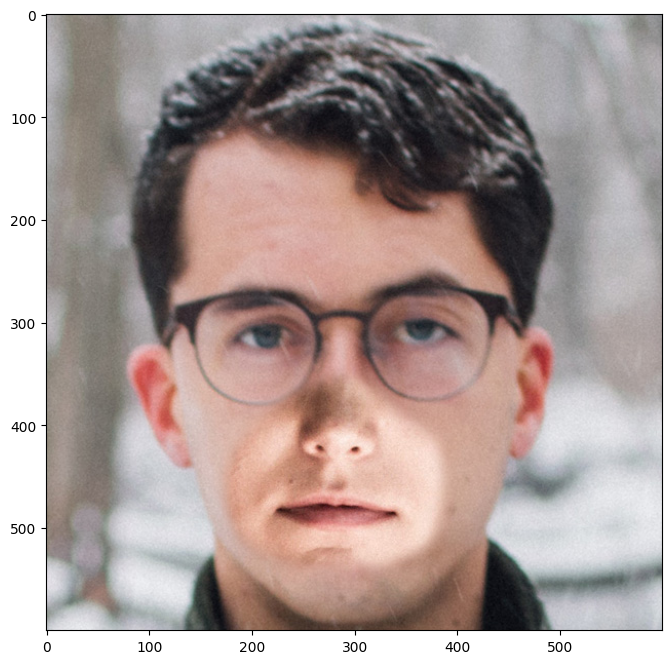

In [34]:
img_path = '../input/real-and-fake-face-detection/real_and_fake_face/training_fake/easy_125_0011.jpg'
img = read_image(img_path)
fig = plt.figure(figsize=(8, 8))
plt.imshow(to_pil_image(img))

Yes, I see it. But what about ResNets? Do they see it?
Let's answer this question using saliency heatmaps and a TorchCAM method.

Defining functions for visualization:

In [35]:
def saliency_map(image_path, model, shape, model_name):
    '''Drawing saliency heatmap for one loaded image'''
    model.to(device)
    model.eval()

    image = read_image(img_path)

    image = resize(image, (224, 224))
    image = image.clone().detach()
    image = image.unsqueeze(0)
    image = image.to(device)
    image = image.float()
    image.requires_grad_()

    output = model(image)
    output_idx = output.argmax()
    output_max = output[0, output_idx]
    output_max.backward()

    saliency, _ = torch.max(image.grad.data.abs(), dim=1)
    saliency = saliency.reshape(shape)

    fig = plt.figure(figsize=(8, 8))
    plt.imshow(saliency.cpu(), origin='upper', cmap='inferno')
    plt.title(model_name)

In [36]:
def grad_mask_vizualiser(img_path, model, model_name):
    '''Drawing a visualization of GradCAM cnn explanation method,
    that shows where in the image are the most important features
    for neural network'''
    model.eval()
    cam_extractor = GradCAMpp(model, 'layer4')
    img = read_image(img_path)
    input_tensor = normalize(resize(img, (224, 224)) / 255.0, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    input_tensor = input_tensor.to(device)
    out = model(input_tensor.unsqueeze(0).cuda())
    cams = cam_extractor(out.squeeze(0).argmax().item(), out)
    for name, cam in zip(cam_extractor.target_names, cams):
        result = overlay_mask(to_pil_image(img), to_pil_image(cam.squeeze(0), mode='F'), alpha=0.5)
        plt.imshow(result)
        plt.axis('off')
        plt.title(model_name)

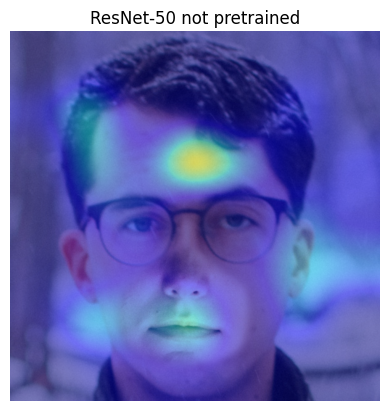

In [37]:
grad_mask_vizualiser(img_path, model_np, 'ResNet-50 not pretrained')

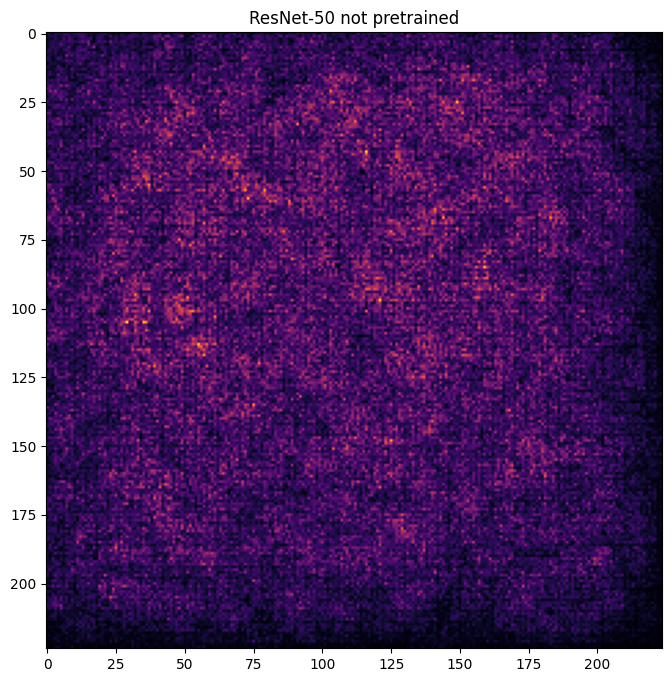

In [38]:
saliency_map(img_path, model_np, (224, 224), 'ResNet-50 not pretrained')

So, not pretrained network noticed that there is something important in the area of the eyes and forehead in the picture. Well-well. The saliency map shows where the largest network gradients were concentrated.

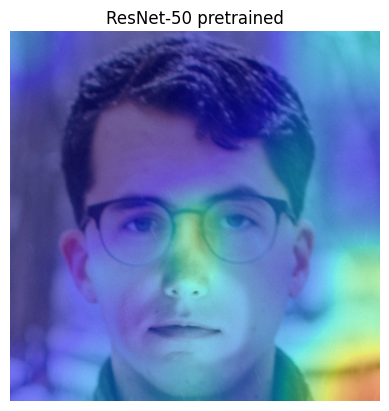

In [39]:
grad_mask_vizualiser(img_path, model_p, 'ResNet-50 pretrained')

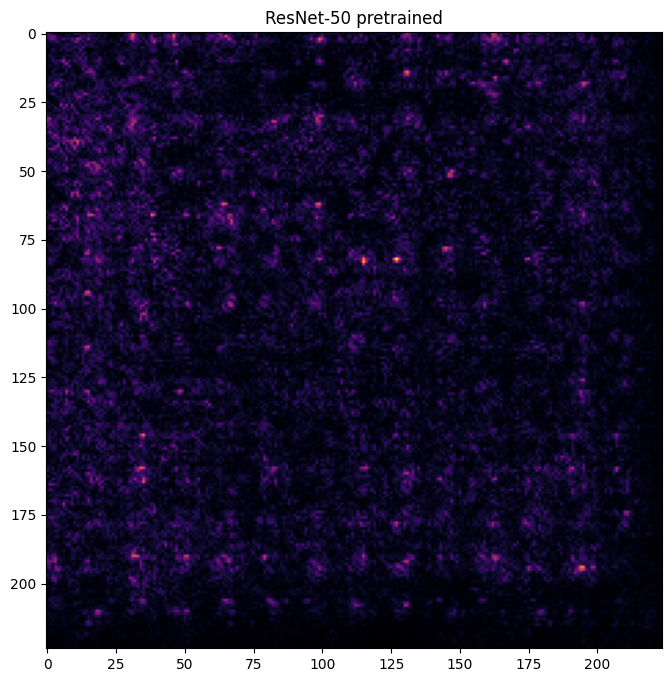

In [40]:
saliency_map(img_path, model_p, (224, 224), 'ResNet-50 pretrained')

The pretrained network is more confident that something is wrong in the mouth and eye (I don't know what's wrong with the eye), and the saliency map also shows that its gradients are more sparse and dotted across the image.

In general, it is clear that it is better to use pre-trained neural networks for tasks where there is little data, and visualizing convolution neural networks is a great way to understand them better.

Thank you for watching!
I do not claim to be an expert, but vote please if you were interested :)